<table class="table table-bordered">
    <tr>
        <th style="text-align:center; vertical-align: middle; width:50%"><img src='https://www.np.edu.sg/images/default-source/default-album/img-logo.png'"></th>
        <th style="text-align:center;"><h1>Deep Learning</h1><h2>Assignment 1 - Food Classification Model (Individual)</h2><h3>AY2023/24 Semester</h3></th>
    </tr>
</table>

In [ ]:
# Import the Required Packages
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, Callback
import tensorflow_probability as tfp

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import os
from PIL import Image

In [ ]:
from google.colab import drive

drive.mount('/content/drive')
!ls "/content/drive/My Drive/"
base_dir = "/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Images"

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

Mounted at /content/drive
'Ngee Ann Poly'  'Udemy Courses'


In [ ]:
x_test = []
y_test = []

class_labels = {'beet_salad': 0, 'beignets': 1, 'ceviche': 2, 'chocolate_mousse': 3, 'cup_cakes': 4,
                'greek_salad': 5, 'grilled_salmon': 6, 'pancakes': 7, 'panna_cotta': 8, 'spaghetti_bolognese': 9}

for class_folder in sorted(os.listdir(test_dir)):
    class_folder_path = os.path.join(test_dir, class_folder)
    if os.path.isdir(class_folder_path):
        class_label = class_labels[class_folder]

        for image_file in sorted(os.listdir(class_folder_path)):
            image_path = os.path.join(class_folder_path, image_file)
            img = Image.open(image_path)
            img = img.resize((224, 224))
            img_array = np.array(img)
            x_test.append(img_array)
            y_test.append(class_label)

x_test = np.array(x_test)
y_test = np.array(y_test)

x_test = x_test.astype('float32') / 255.0

## 1. Mixup

In [ ]:
img_size = 224

model_1 = models.Sequential()
model_1.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
model_1.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_1.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Flatten())
model_1.add(layers.Dense(10, activation='softmax'))

In [ ]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                   

In [ ]:
model_1.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.Adam(learning_rate=0.0005),
    metrics=['acc']
)

In [ ]:
checkpoint_filepath = '/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_1.tf'

model_checkpoint = ModelCheckpoint(
    checkpoint_filepath,
    monitor='val_acc',
    save_best_only=True,
    mode='max',
    verbose=1
)

In [ ]:
class MixupImageDataGenerator(ImageDataGenerator):
    def __init__(self, mixup_alpha=0.2, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.mixup_alpha = mixup_alpha
        self.image_data_generator = ImageDataGenerator()

    def mixup_augmentation(self, image_batch, label_batch):
        batch_size = len(image_batch)
        lam = np.random.beta(self.mixup_alpha, self.mixup_alpha, batch_size)
        index = np.random.permutation(batch_size)

        mixed_image_batch = lam.reshape(batch_size, 1, 1, 1) * image_batch + (1 - lam).reshape(batch_size, 1, 1, 1) * image_batch[index]
        mixed_label_batch = lam.reshape(batch_size, 1) * label_batch + (1 - lam).reshape(batch_size, 1) * label_batch[index]

        return mixed_image_batch, mixed_label_batch

    def flow_from_directory(self, *args, **kwargs):
        generator = super().flow_from_directory(*args, **kwargs)

        while True:
            image_batch, label_batch = next(generator)
            mixed_image_batch, mixed_label_batch = self.mixup_augmentation(image_batch, label_batch)
            yield mixed_image_batch, mixed_label_batch

In [ ]:
train_datagen = MixupImageDataGenerator(
    mixup_alpha=0.2,
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

validation_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=25,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_size, img_size),
    batch_size=25,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=25,
    class_mode='categorical'
)

Found 2000 images belonging to 10 classes.
Found 500 images belonging to 10 classes.


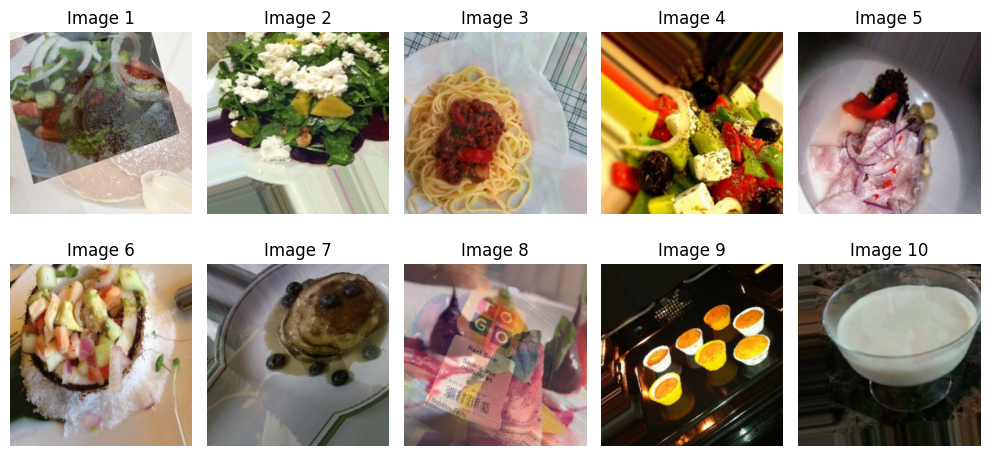

Image 1: 
[0.0, 0.0, 0.0, 0.0, 0.0, 0.645363414194718, 0.0, 0.354636585805282, 0.0, 0.0]

Image 2: 
[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Image 3: 
[0.0, 0.0, 0.0, 0.0, 0.0, 0.10822936309480058, 0.0, 0.0, 0.0, 0.8917706369051994]

Image 4: 
[0.0, 0.0, 0.0, 0.0, 0.0, 0.976484126846689, 0.0, 0.0, 0.0, 0.02351587315331105]

Image 5: 
[0.06323518792480798, 0.0, 0.936764812075192, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Image 6: 
[0.0, 5.709769053119373e-07, 0.9999994290230947, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Image 7: 
[0.0, 0.0, 0.0, 0.1376077082642324, 0.0, 0.0, 0.0, 0.8623922917357676, 0.0, 0.0]

Image 8: 
[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Image 9: 
[0.005407998050070306, 0.0, 0.0, 0.0, 0.9945920019499297, 0.0, 0.0, 0.0, 0.0, 0.0]

Image 10: 
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0604586286979469, 0.0, 0.0, 0.9395413713020531, 0.0]



In [ ]:
mixed_images, mixed_labels = next(train_generator)

labels = []

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.title(f"Image {i+1}")
    plt.imshow(mixed_images[i])
    plt.axis('off')
    labels.append(mixed_labels[i])

plt.tight_layout()
plt.show()

for i in range(len(labels)):
  print(f'Image {i+1}: \n{list(labels[i])}\n')

In [ ]:
history = model_1.fit(
    train_generator,
    steps_per_epoch=300,
    epochs=80,
    validation_data=validation_generator,
    validation_steps=80,
    callbacks=[model_checkpoint],
    verbose=1
)

Epoch 1/80
300/300 [==============================] - ETA: 0s - loss: 2.1697 - acc: 0.2079
Epoch 1: val_acc improved from -inf to 0.28750, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_1.tf
300/300 [==============================] - 2536s 8s/step - loss: 2.1697 - acc: 0.2079 - val_loss: 1.9582 - val_acc: 0.2875
Epoch 2/80
300/300 [==============================] - ETA: 0s - loss: 2.0345 - acc: 0.2696
Epoch 2: val_acc improved from 0.28750 to 0.32350, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_1.tf
300/300 [==============================] - 147s 491ms/step - loss: 2.0345 - acc: 0.2696 - val_loss: 1.8616 - val_acc: 0.3235
Epoch 3/80
300/300 [==============================] - ETA: 0s - loss: 1.9554 - acc: 0.2984
Epoch 3: val_acc improved from 0.32350 to 0.33400, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_1.tf
300/300 [==============================] 

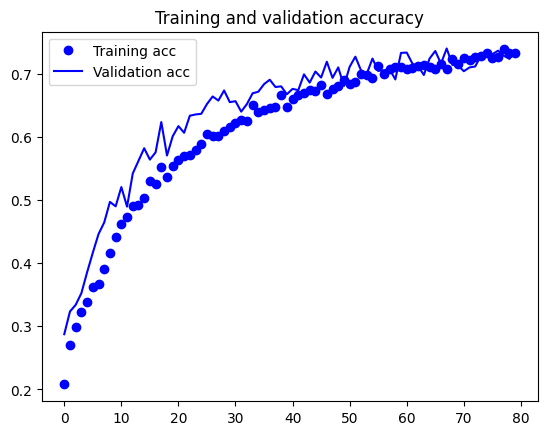

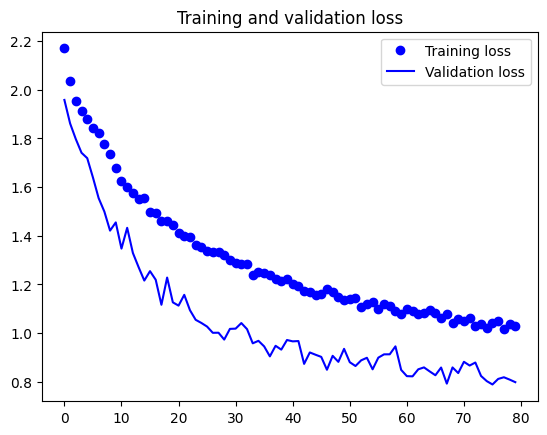

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
model_1 = keras.models.load_model('/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_1.tf')

evaluation_results = model_1.evaluate(test_generator, steps=len(test_generator))

print("Test Loss:", evaluation_results[0])
print("Test Accuracy:", evaluation_results[1])

20/20 [==============================] - 3s 120ms/step - loss: 0.8053 - acc: 0.7400
Test Loss: 0.8052988648414612
Test Accuracy: 0.7400000095367432


In [ ]:
predictions = model_1.predict(x_test)
predicted_labels = np.argmax(predictions, axis= 1)

# Get the true labels from the test data generator
true_labels = test_generator.classes

# Create the classification report
class_report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("Classification Report:")
print(class_report)

16/16 [==============================] - 2s 69ms/step
Classification Report:
                     precision    recall  f1-score   support

         beet_salad       0.75      0.80      0.78        50
           beignets       0.90      0.74      0.81        50
            ceviche       0.79      0.66      0.72        50
   chocolate_mousse       0.66      0.58      0.62        50
          cup_cakes       0.71      0.70      0.71        50
        greek_salad       0.66      0.86      0.75        50
     grilled_salmon       0.73      0.72      0.73        50
           pancakes       0.82      0.84      0.83        50
        panna_cotta       0.64      0.70      0.67        50
spaghetti_bolognese       0.92      0.94      0.93        50

           accuracy                           0.75       500
          macro avg       0.76      0.75      0.75       500
       weighted avg       0.76      0.75      0.75       500



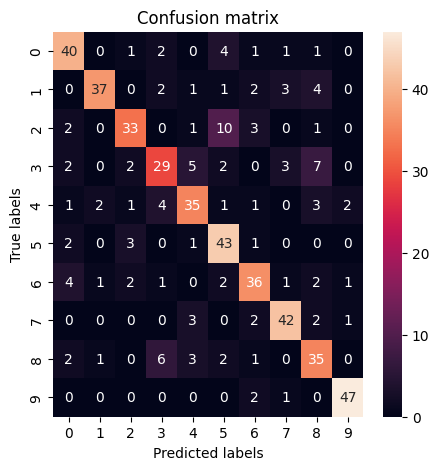

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, predicted_labels)

plt.figure(figsize=(5,5))
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

In [ ]:
# Load the food list (in alphabetical order)
with open('/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/18.txt', 'r') as f: # the .txt file which contains a list of food assigned to you
    x = f.readlines()
food_list =[]
for item in x:
    food_list.append(item.strip('\n'))
food_list = sorted(food_list) # food_list needs to be sorted alphabetically before feed into prediction() function
print(food_list)

['beet_salad', 'beignets', 'ceviche', 'chocolate_mousse', 'cup_cakes', 'greek_salad', 'grilled_salmon', 'pancakes', 'panna_cotta', 'spaghetti_bolognese']


In [ ]:
# Define some related functions for image process and model prediction
from tensorflow.keras.preprocessing.image import load_img, img_to_array
def image_process(img):
    image = load_img(img, target_size =(img_size, img_size))
    image_array = img_to_array(image)/255
    return image_array

import pandas as pd
def prediction(model, img_array, items_l):
    prob = model.predict(img_array.reshape(1,img_size,img_size,3))
    pro_df = pd.DataFrame(prob, columns = items_l)
    result = items_l[np.argmax(prob)]
    return pro_df, result

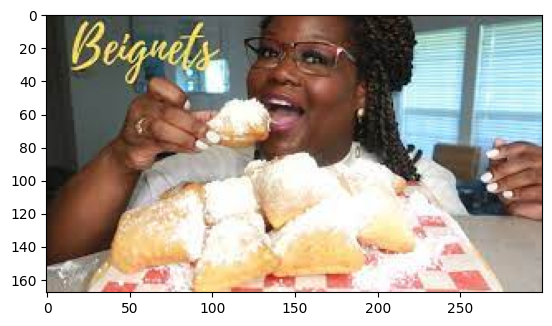

1/1 [==============================] - 0s 165ms/step

Image: beignets2.jpg
The prediction is: cup_cakes 

    beet_salad  beignets  ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.059928  0.096093  0.08686          0.083908   0.509798     0.010713   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0         0.04625  0.051963     0.049905             0.004581  
----------------------------------------


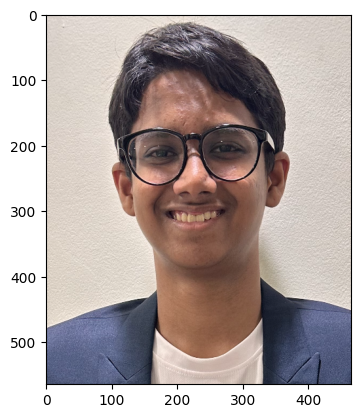

1/1 [==============================] - 0s 17ms/step

Image: person2.png
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.011468  0.031901  0.032154          0.742999   0.046261     0.008277   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.021992  0.063193     0.034676             0.007079  
----------------------------------------


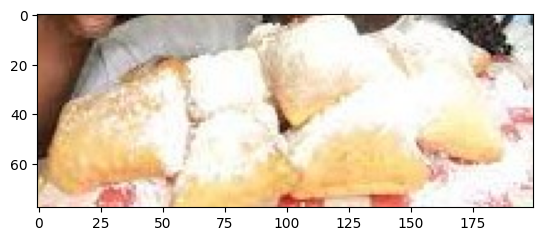

1/1 [==============================] - 0s 19ms/step

Image: beignets3.jpg
The prediction is: panna_cotta 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0     0.01937  0.201044  0.038311          0.037178   0.197783     0.013702   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.016493  0.031795      0.43937             0.004953  
----------------------------------------


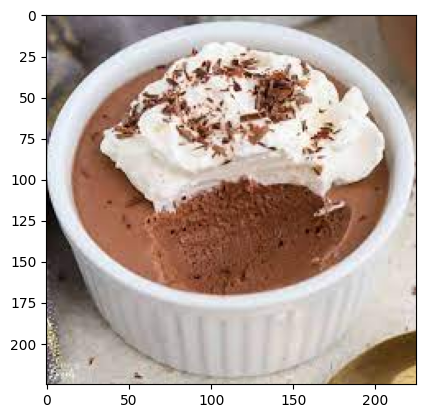

1/1 [==============================] - 0s 21ms/step

Image: chocolate mousse1.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets  ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.002224   0.06424  0.00112          0.827412   0.007742        0.014   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.004606  0.022443     0.005911             0.050302  
----------------------------------------


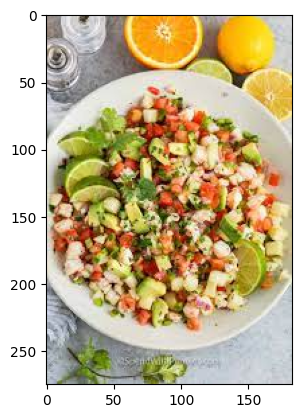

1/1 [==============================] - 0s 26ms/step

Image: ceviche1.jpg
The prediction is: ceviche 

    beet_salad      beignets   ceviche  chocolate_mousse     cup_cakes  \
0    0.001776  5.965939e-09  0.741893      4.255210e-08  1.398786e-08   

   greek_salad  grilled_salmon      pancakes   panna_cotta  \
0     0.256312        0.000014  2.049918e-07  5.651135e-08   

   spaghetti_bolognese  
0             0.000005  
----------------------------------------


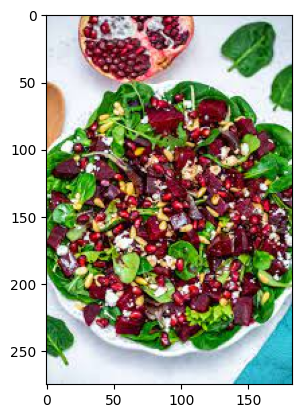

1/1 [==============================] - 0s 28ms/step

Image: beetsalad1.jpg
The prediction is: beet_salad 

    beet_salad      beignets   ceviche  chocolate_mousse     cup_cakes  \
0    0.993029  3.999438e-09  0.000145      1.135518e-07  9.121884e-08   

   greek_salad  grilled_salmon      pancakes   panna_cotta  \
0     0.006812        0.000012  1.967122e-07  2.501350e-07   

   spaghetti_bolognese  
0         9.042326e-07  
----------------------------------------


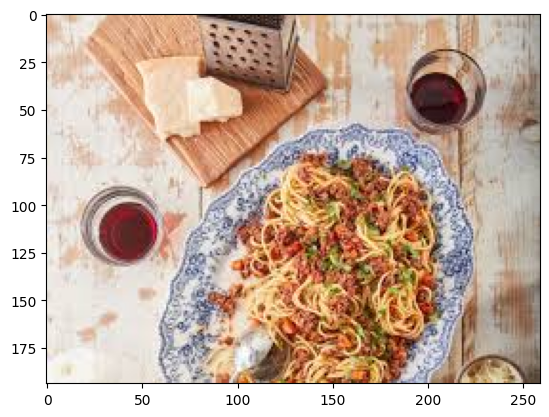

1/1 [==============================] - 0s 27ms/step

Image: spaghetti bolognese2.jpg
The prediction is: spaghetti_bolognese 

    beet_salad  beignets  ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.023152  0.022216  0.03653          0.106821   0.003988     0.028966   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.116162  0.027987     0.007264             0.626914  
----------------------------------------


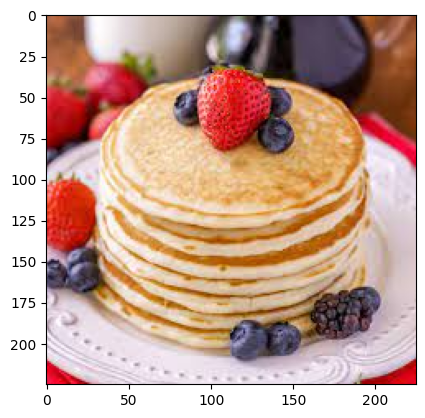

1/1 [==============================] - 0s 26ms/step

Image: pancake1.jpg
The prediction is: pancakes 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.012415  0.000099  0.014978          0.019926   0.004625     0.048466   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.000785  0.681341     0.007358             0.210006  
----------------------------------------


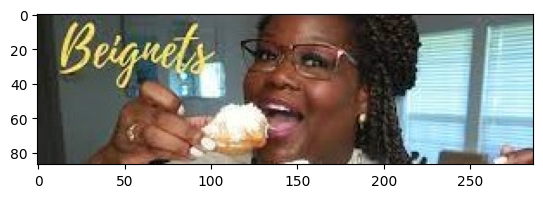

1/1 [==============================] - 0s 20ms/step

Image: person1.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.042269  0.190391  0.088808          0.303495   0.112682     0.037211   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.050445  0.096527     0.069282              0.00889  
----------------------------------------


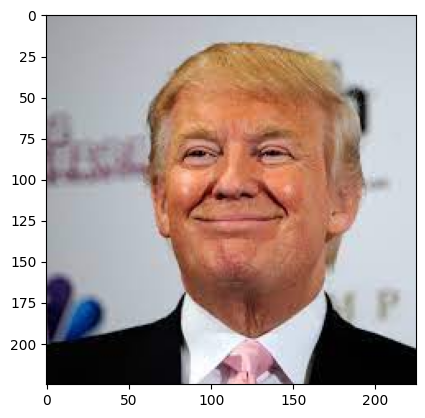

1/1 [==============================] - 0s 22ms/step

Image: donald trump.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.075317  0.033749  0.020077          0.360041   0.358067     0.040326   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.055651  0.034998       0.0153             0.006474  
----------------------------------------


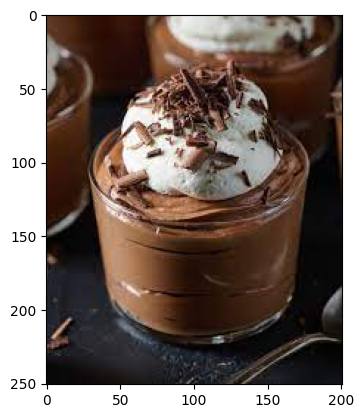

1/1 [==============================] - 0s 36ms/step

Image: chocolate mousse2.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets  ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.013342  0.003984  0.00724          0.784714   0.077676     0.015593   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.002585  0.030015     0.049835             0.015014  
----------------------------------------


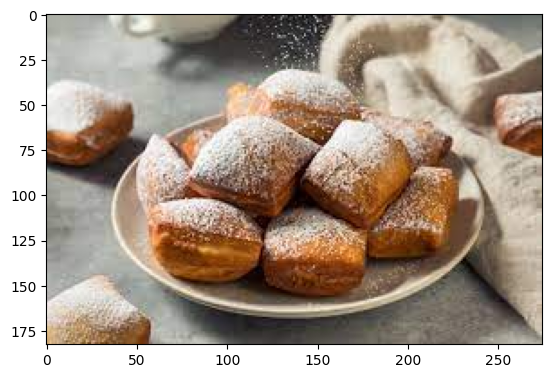

1/1 [==============================] - 0s 26ms/step

Image: beignets1.jpg
The prediction is: beignets 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0     0.00005  0.991797  0.000086          0.000052   0.000384     0.000383   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.000254  0.006833     0.000035             0.000127  
----------------------------------------


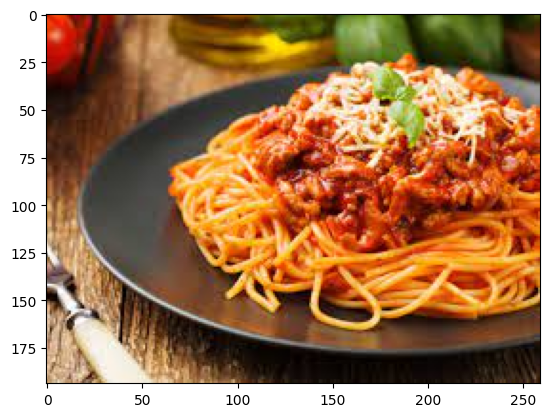

1/1 [==============================] - 0s 40ms/step

Image: spaghetti bolognese1.jpg
The prediction is: spaghetti_bolognese 

    beet_salad      beignets   ceviche  chocolate_mousse  cup_cakes  \
0    0.000022  1.619266e-07  0.000235          0.000003   0.000017   

   greek_salad  grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0     0.000004        0.000662  0.000002     0.000001             0.999054  
----------------------------------------


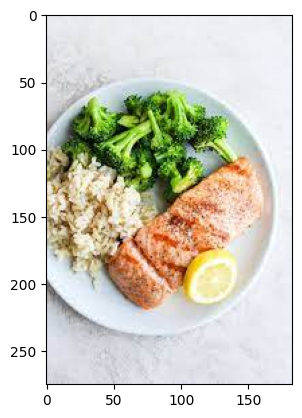

1/1 [==============================] - 0s 27ms/step

Image: grilled salmon1.jpg
The prediction is: greek_salad 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.174165  0.003296  0.097549          0.017898   0.002751     0.492065   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.175228   0.00227     0.008299             0.026478  
----------------------------------------


In [ ]:
online_images_dir = '/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Online Images'
image_files = os.listdir(online_images_dir)

for image_file in image_files:
    img_path = os.path.join(online_images_dir, image_file)
    plt.imshow(plt.imread(img_path))
    plt.show()

    img_array = image_process(img_path)
    prob_df, result = prediction(model_1, img_array, food_list)

    print(f'\nImage: {image_file}')
    print('The prediction is:', result, '\n\n', prob_df)
    print('-' * 40)

## 2. Random Eraser

In [ ]:
img_size = 224

model_2 = models.Sequential()
model_2.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_size, img_size, 3)))
model_2.add(layers.Conv2D(32, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Flatten())
model_2.add(layers.Dense(10, activation='softmax'))

In [ ]:
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 conv2d_13 (Conv2D)          (None, 220, 220, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 110, 110, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 108, 108, 64)      18496     
                                                                 
 conv2d_15 (Conv2D)          (None, 106, 106, 64)      36928     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                 

In [ ]:
model_2.compile(
    loss='categorical_crossentropy',
    optimizer=optimizers.Adam(learning_rate=0.0005),
    metrics=['acc']
)

In [ ]:
checkpoint_filepath = '/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_2.tf'

model_checkpoint = ModelCheckpoint(
    checkpoint_filepath,
    monitor='val_acc',
    save_best_only=True,
    mode='max',
    verbose=1
)

In [ ]:
def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255):
    def eraser(input_img):
        img_h, img_w, _ = input_img.shape
        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        c = np.random.uniform(v_l, v_h)
        input_img[top:top + h, left:left + w, :] = c

        return input_img

    return eraser

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=get_random_eraser(v_l=0, v_h=255))

validation_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        batch_size=25,
        class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=25,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_size, img_size),
    batch_size=25,
    class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Found 500 images belonging to 10 classes.


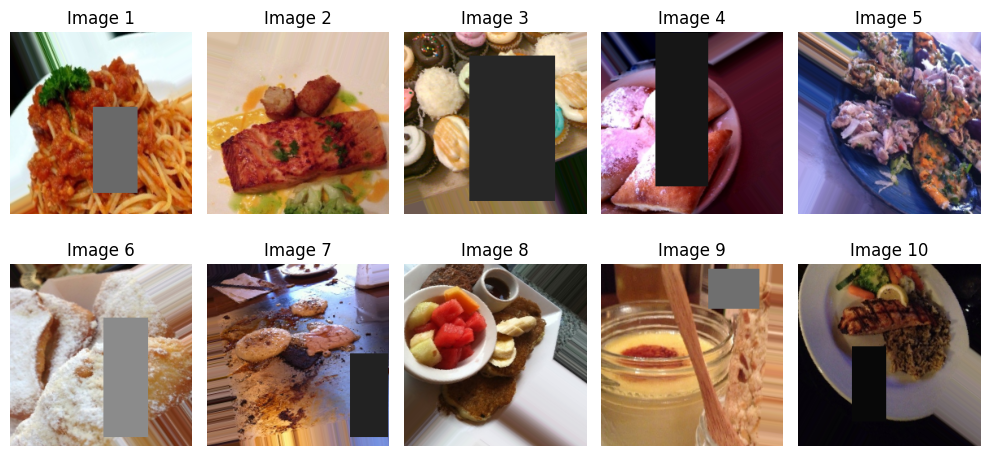

In [ ]:
mixed_images, mixed_labels = next(train_generator)

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.title(f"Image {i+1}")
    plt.imshow(mixed_images[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
history = model_2.fit(
    train_generator,
    steps_per_epoch=300,
    epochs=80,
    validation_data=validation_generator,
    validation_steps=80,
    callbacks=[model_checkpoint],
    verbose=1
)

Epoch 1/80
300/300 [==============================] - ETA: 0s - loss: 2.2110 - acc: 0.1739
Epoch 1: val_acc improved from -inf to 0.28550, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_2.tf
300/300 [==============================] - 134s 441ms/step - loss: 2.2110 - acc: 0.1739 - val_loss: 1.9846 - val_acc: 0.2855
Epoch 2/80
300/300 [==============================] - ETA: 0s - loss: 1.9825 - acc: 0.2779
Epoch 2: val_acc improved from 0.28550 to 0.34450, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_2.tf
300/300 [==============================] - 132s 442ms/step - loss: 1.9825 - acc: 0.2779 - val_loss: 1.8779 - val_acc: 0.3445
Epoch 3/80
300/300 [==============================] - ETA: 0s - loss: 1.8659 - acc: 0.3151
Epoch 3: val_acc improved from 0.34450 to 0.37450, saving model to /content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_2.tf
300/300 [==============================

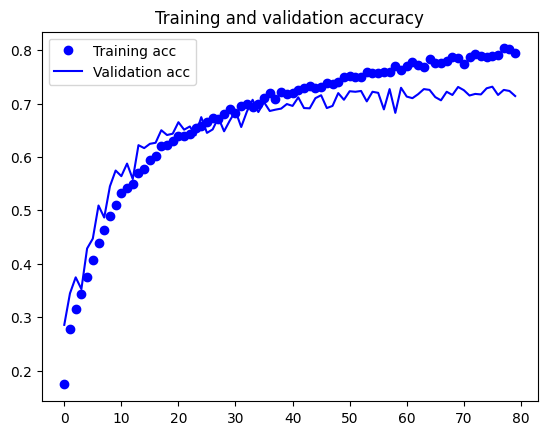

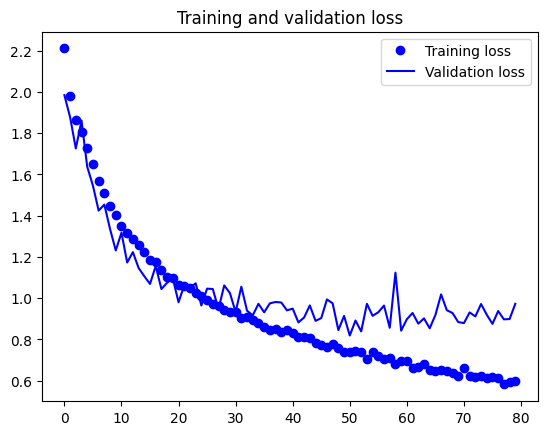

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
model_2 = keras.models.load_model('/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Code/Step 3/model_2.tf')

evaluation_results = model_2.evaluate(test_generator, steps=len(test_generator))

print("Test Loss:", evaluation_results[0])
print("Test Accuracy:", evaluation_results[1])

20/20 [==============================] - 2s 94ms/step - loss: 0.8930 - acc: 0.7260
Test Loss: 0.8930214047431946
Test Accuracy: 0.7260000109672546


In [ ]:
predictions = model_2.predict(x_test)
predicted_labels = np.argmax(predictions, axis= 1)

# Get the true labels from the test data generator
true_labels = test_generator.classes

# Create the classification report
class_report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("Classification Report:")
print(class_report)

16/16 [==============================] - 1s 41ms/step
Classification Report:
                     precision    recall  f1-score   support

         beet_salad       0.85      0.70      0.77        50
           beignets       0.83      0.86      0.84        50
            ceviche       0.75      0.86      0.80        50
   chocolate_mousse       0.60      0.54      0.57        50
          cup_cakes       0.72      0.68      0.70        50
        greek_salad       0.76      0.74      0.75        50
     grilled_salmon       0.73      0.74      0.73        50
           pancakes       0.74      0.80      0.77        50
        panna_cotta       0.66      0.74      0.70        50
spaghetti_bolognese       0.92      0.88      0.90        50

           accuracy                           0.75       500
          macro avg       0.76      0.75      0.75       500
       weighted avg       0.76      0.75      0.75       500



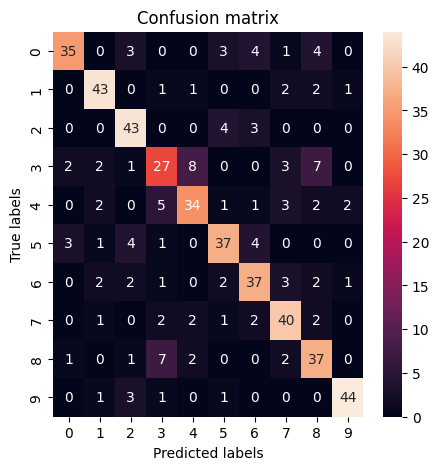

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, predicted_labels)

plt.figure(figsize=(5,5))
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion matrix')
plt.show()

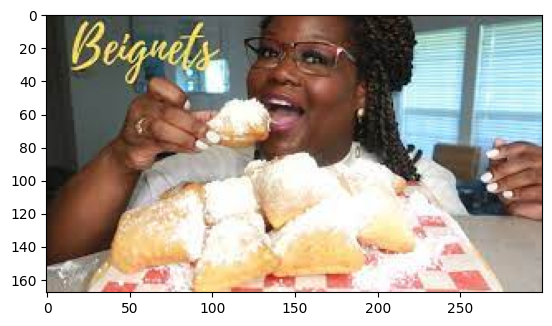

1/1 [==============================] - 0s 37ms/step

Image: beignets2.jpg
The prediction is: cup_cakes 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000057  0.316903  0.171375          0.031581   0.452576     0.001262   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.015453   0.00343     0.007341             0.000023  
----------------------------------------


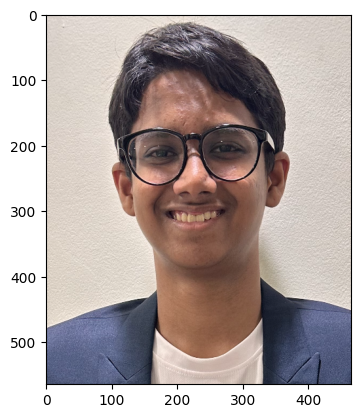

1/1 [==============================] - 0s 70ms/step

Image: person2.png
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000003  0.011632  0.000085          0.985486   0.001651     0.000004   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.000053  0.000422     0.000648             0.000017  
----------------------------------------


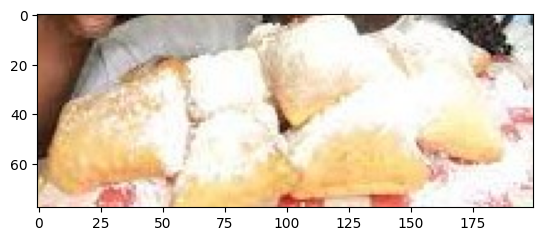

1/1 [==============================] - 0s 37ms/step

Image: beignets3.jpg
The prediction is: beignets 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000048  0.935601  0.001552          0.005098   0.037588     0.000061   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.001333  0.001532     0.017158              0.00003  
----------------------------------------


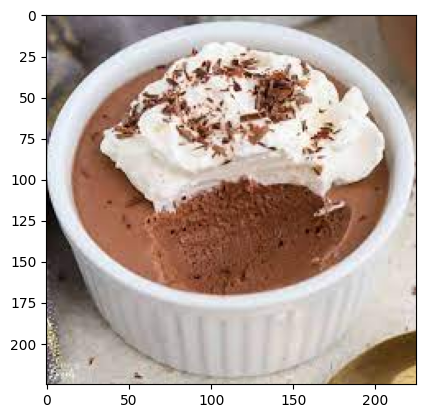

1/1 [==============================] - 0s 38ms/step

Image: chocolate mousse1.jpg
The prediction is: chocolate_mousse 

      beet_salad  beignets       ceviche  chocolate_mousse  cup_cakes  \
0  7.338852e-08  0.018172  5.288557e-07          0.981386   0.000288   

    greek_salad  grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0  1.241484e-07    6.856495e-07  0.000098     0.000036             0.000018  
----------------------------------------


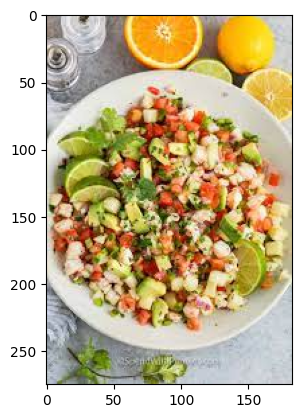

1/1 [==============================] - 0s 69ms/step

Image: ceviche1.jpg
The prediction is: ceviche 

    beet_salad      beignets   ceviche  chocolate_mousse     cup_cakes  \
0    0.000003  1.141385e-23  0.887689      4.779495e-20  2.526538e-19   

   greek_salad  grilled_salmon      pancakes   panna_cotta  \
0     0.112308    4.614842e-07  5.980742e-18  5.406927e-17   

   spaghetti_bolognese  
0         3.699922e-12  
----------------------------------------


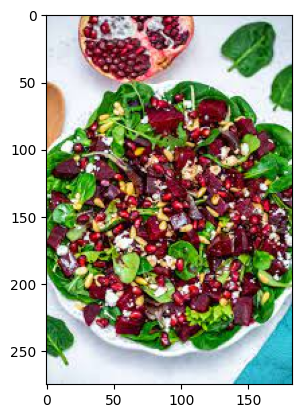

1/1 [==============================] - 0s 62ms/step

Image: beetsalad1.jpg
The prediction is: beet_salad 

    beet_salad      beignets       ceviche  chocolate_mousse     cup_cakes  \
0    0.999215  6.435623e-28  7.466534e-13      1.332217e-20  2.650293e-24   

   greek_salad  grilled_salmon      pancakes   panna_cotta  \
0     0.000785    1.215800e-12  9.334741e-21  2.396443e-16   

   spaghetti_bolognese  
0         1.097925e-24  
----------------------------------------


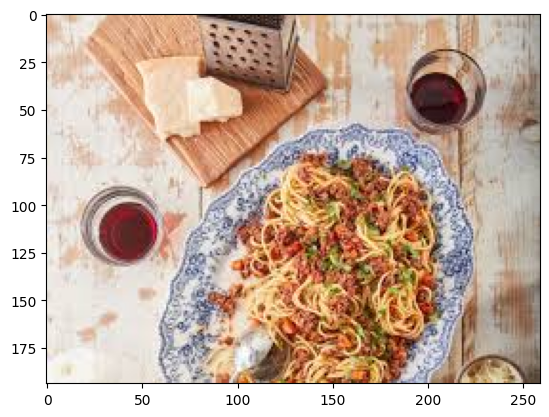

1/1 [==============================] - 0s 116ms/step

Image: spaghetti bolognese2.jpg
The prediction is: beignets 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000156  0.568898  0.000097          0.051634   0.000734     0.000282   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0         0.00327  0.314347     0.049638             0.010943  
----------------------------------------


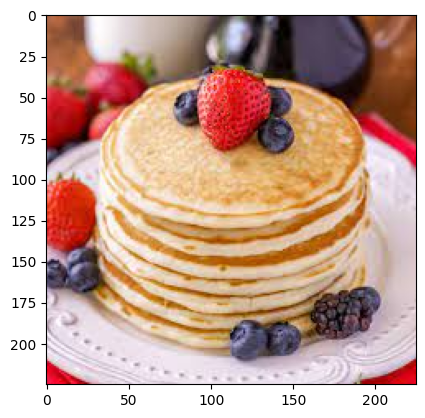

1/1 [==============================] - 0s 45ms/step

Image: pancake1.jpg
The prediction is: pancakes 

      beet_salad      beignets   ceviche  chocolate_mousse  cup_cakes  \
0  7.980428e-07  8.742700e-08  0.000048      5.781303e-07   0.000132   

   greek_salad  grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0     0.000005        0.000023  0.897389     0.000136             0.102265  
----------------------------------------


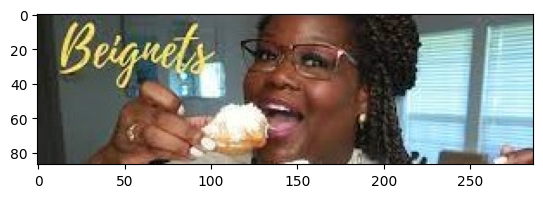

1/1 [==============================] - 0s 89ms/step

Image: person1.jpg
The prediction is: beignets 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0     0.00018  0.523011  0.002892          0.228253   0.170667     0.000232   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.047769  0.022754     0.003857             0.000385  
----------------------------------------


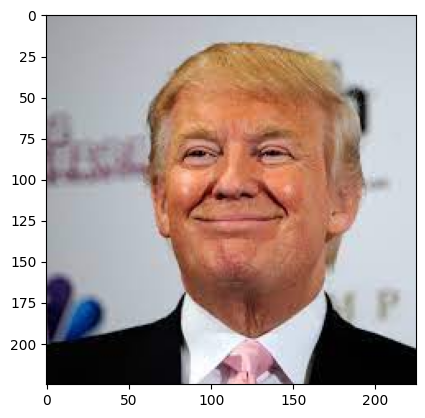

1/1 [==============================] - 0s 33ms/step

Image: donald trump.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000148  0.067939  0.002574           0.88893   0.019842     0.000132   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.008654  0.006295      0.00509             0.000395  
----------------------------------------


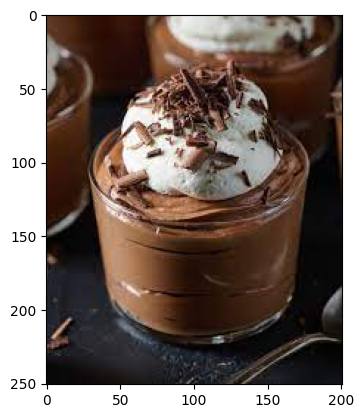

1/1 [==============================] - 0s 28ms/step

Image: chocolate mousse2.jpg
The prediction is: chocolate_mousse 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.000324  0.003552  0.009065          0.872253   0.062406     0.000851   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.000661  0.027228     0.021029             0.002632  
----------------------------------------


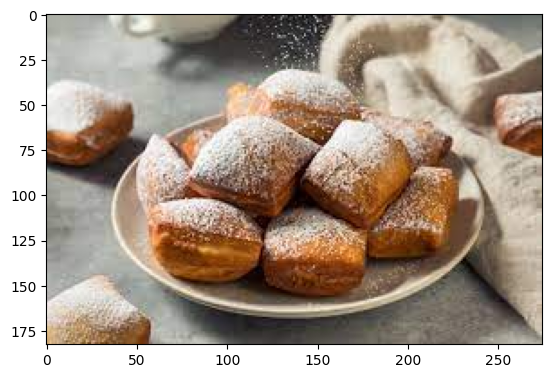

1/1 [==============================] - 0s 32ms/step

Image: beignets1.jpg
The prediction is: beignets 

      beet_salad  beignets       ceviche  chocolate_mousse     cup_cakes  \
0  2.083365e-15  0.999999  1.008349e-15      6.684860e-12  1.556950e-11   

    greek_salad  grilled_salmon  pancakes   panna_cotta  spaghetti_bolognese  
0  1.823708e-13    4.088690e-11  0.000001  2.551884e-13         1.683281e-11  
----------------------------------------


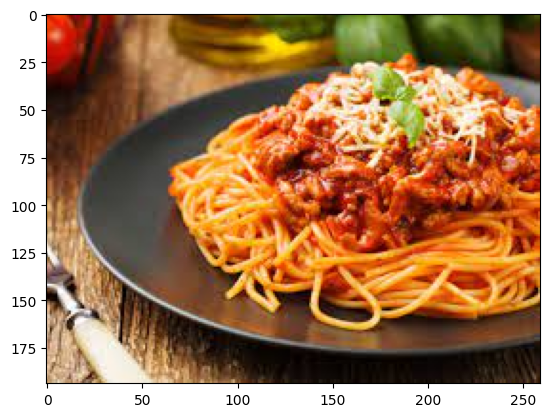

1/1 [==============================] - 0s 27ms/step

Image: spaghetti bolognese1.jpg
The prediction is: spaghetti_bolognese 

      beet_salad      beignets   ceviche  chocolate_mousse     cup_cakes  \
0  9.829095e-08  8.492696e-14  0.000145      1.228496e-10  7.246552e-08   

    greek_salad  grilled_salmon      pancakes   panna_cotta  \
0  6.371385e-10        0.000015  1.077959e-08  3.215845e-09   

   spaghetti_bolognese  
0              0.99984  
----------------------------------------


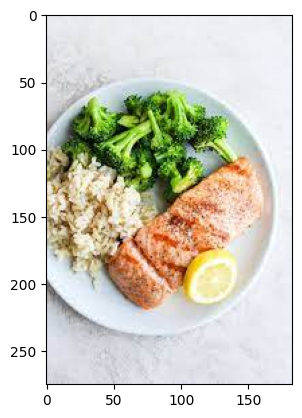

1/1 [==============================] - 0s 36ms/step

Image: grilled salmon1.jpg
The prediction is: grilled_salmon 

    beet_salad  beignets   ceviche  chocolate_mousse  cup_cakes  greek_salad  \
0    0.199886  0.003381  0.037945          0.012212   0.005526     0.005134   

   grilled_salmon  pancakes  panna_cotta  spaghetti_bolognese  
0        0.625046  0.001471     0.108974             0.000426  
----------------------------------------


In [ ]:
online_images_dir = '/content/drive/My Drive/Ngee Ann Poly/Deep Learning/ASG1/Online Images'
image_files = os.listdir(online_images_dir)

for image_file in image_files:
    img_path = os.path.join(online_images_dir, image_file)
    plt.imshow(plt.imread(img_path))
    plt.show()

    img_array = image_process(img_path)
    prob_df, result = prediction(model_2, img_array, food_list)

    print(f'\nImage: {image_file}')
    print('The prediction is:', result, '\n\n', prob_df)
    print('-' * 40)